In [ ]:
pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 8.2 MB/s eta 0:00:00


In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=4387219dd1204d115ee430338ea14d5f03c1253a0bc5cbd2baa18ac6ba2f8348
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


Importing necessary packages

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import shap
import lime
import xgboost as xgb

#ignoring all warnings
import warnings
warnings.filterwarnings('ignore')

Getting the data

In [ ]:
#getting the data and labels from the dataset
data, labels = shap.datasets.adult(display=True)

#storing the labels as an numpy array
labels = np.array([int(label) for label in labels])

print(data.shape, labels.shape)
data.head()

(32561, 12) (32561,)


,Age,Workclass,Education-Num,Marital Status,Occupation,Relationship,Race,Sex,Capital Gain,Capital Loss,Hours per week,Country
0,39.0,State-gov,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States
1,50.0,Self-emp-not-inc,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States
2,38.0,Private,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States
3,53.0,Private,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States
4,28.0,Private,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba


In [ ]:
# Storing names of all categorical columns in cat_cols
cat_cols = data.select_dtypes(['category']).columns
cat_cols

Index(['Workclass', 'Marital Status', 'Occupation', 'Relationship', 'Race',
       'Sex', 'Country'],
      dtype='object')

In [ ]:
# Converting the categorical columns into numerical columns
data[cat_cols] = data[cat_cols].apply(lambda x: x.cat.codes)
data.head()

,Age,Workclass,Education-Num,Marital Status,Occupation,Relationship,Race,Sex,Capital Gain,Capital Loss,Hours per week,Country
0,39.0,7,13.0,4,1,1,4,1,2174.0,0.0,40.0,39
1,50.0,6,13.0,2,4,0,4,1,0.0,0.0,13.0,39
2,38.0,4,9.0,0,6,1,4,1,0.0,0.0,40.0,39
3,53.0,4,7.0,2,6,0,2,1,0.0,0.0,40.0,39
4,28.0,4,13.0,2,10,5,2,0,0.0,0.0,40.0,5


Pre-Processed Dataset

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=7)
print(X_train.shape, X_test.shape)
X_train.head()

(22792, 12) (9769, 12)


,Age,Workclass,Education-Num,Marital Status,Occupation,Relationship,Race,Sex,Capital Gain,Capital Loss,Hours per week,Country
24027,86.0,4,14.0,4,1,1,4,0,0.0,0.0,40.0,39
10781,58.0,6,5.0,5,3,1,4,1,0.0,0.0,40.0,39
8676,27.0,4,13.0,4,10,1,4,0,0.0,0.0,40.0,39
14485,33.0,2,3.0,4,8,4,3,0,0.0,0.0,40.0,8
26811,48.0,4,15.0,0,10,4,4,0,0.0,0.0,25.0,39


Original Dataset

In [ ]:
data_disp, labels_disp = shap.datasets.adult(display=True)
X_train_disp, X_test_disp, y_train_disp, y_test_disp = train_test_split(data_disp, labels_disp, test_size=0.3, random_state=7)
print(X_train_disp.shape, X_test_disp.shape)
X_train_disp.head(3)

(22792, 12) (9769, 12)


,Age,Workclass,Education-Num,Marital Status,Occupation,Relationship,Race,Sex,Capital Gain,Capital Loss,Hours per week,Country
24027,86.0,Private,14.0,Never-married,Adm-clerical,Not-in-family,White,Female,0.0,0.0,40.0,United-States
10781,58.0,Self-emp-not-inc,5.0,Separated,Craft-repair,Not-in-family,White,Male,0.0,0.0,40.0,United-States
8676,27.0,Private,13.0,Never-married,Prof-specialty,Not-in-family,White,Female,0.0,0.0,40.0,United-States


Creating a basic XGBoost Classifier

In [ ]:
xgc = xgb.XGBClassifier(n_estimators=300, max_depth=10, random_state=7) # Creating a XGB Classifier

In [ ]:
xgc.fit(X_train, y_train) # Training the model with fit method

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)

In [ ]:
y_pred_test = xgc.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [ ]:
accuracy_score(y_test, y_pred_test)

0.8588391851776026

In [ ]:
# View confusion matrix for test data and predictions
confusion_matrix(y_test, y_pred_test)

array([[6843,  570],
       [ 809, 1547]])

In [ ]:
# Precision
precision_score(y_test, y_pred_test, average=None)[0]

0.8942760062728699

In [ ]:
# Recall
recall_score(y_test, y_pred_test, average=None)[0]

0.9231080534196682

In [ ]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.89      0.92      0.91      7413
           1       0.73      0.66      0.69      2356

    accuracy                           0.86      9769
   macro avg       0.81      0.79      0.80      9769
weighted avg       0.85      0.86      0.86      9769



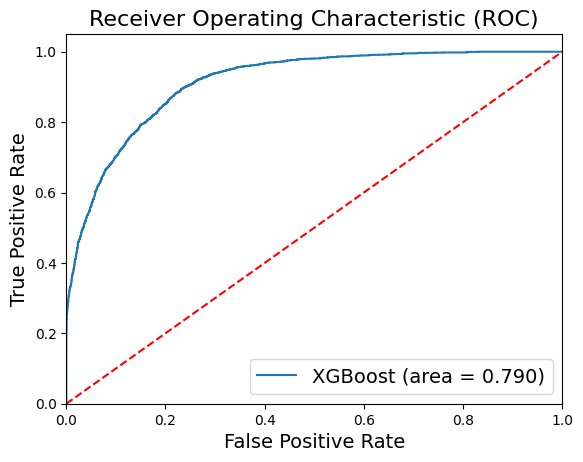

In [ ]:
# Building ROC curve
rf_roc_auc = roc_auc_score(y_test, xgc.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, xgc.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='XGBoost (area = %0.3f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('Receiver Operating Characteristic (ROC)', fontsize=16)
plt.legend(loc="lower right", fontsize=14)
plt.show();

**SHAP**

In [ ]:
# creating an explainer for our model
explainer = shap.TreeExplainer(xgc)

# finding out the shap values using the explainer
shap_values = explainer.shap_values(X_test)

# Expected/Base/Reference value = the value that would be predicted if we didn’t know any features of the current output”
print('Expected Value:', explainer.expected_value)

# displaying the first 5 rows of the shap values table
pd.DataFrame(shap_values).head()

Expected Value: -1.3564825


,0,1,2,3,4,5,6,7,8,9,10,11
0,0.061584,0.169097,-0.160483,-1.540208,0.398436,-0.991450,0.071211,-0.424244,-0.205639,-1.362059,-0.093824,0.010891
1,1.056327,0.945692,1.073349,-0.430263,0.696494,-0.107103,0.064365,0.383968,-0.141023,-0.041612,1.343674,-0.023429
2,-3.626617,-0.011244,0.066431,0.523549,-0.112365,-0.224270,0.051244,0.071056,-0.267034,-0.124119,-0.802146,0.005451
3,-2.694721,0.417012,0.352280,-1.229488,0.017731,-0.664719,-0.029650,0.182703,-0.214500,-0.079357,-0.829920,0.026767
4,-0.162455,-0.066659,0.831841,0.348955,0.094649,0.175976,0.009703,0.073206,-0.289706,-0.114009,-2.667305,0.015598


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value,
                shap_values[0,:], X_test_disp.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value,
                shap_values[1,:], X_test_disp.iloc[1,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value,
                shap_values[:1000,:], X_test.iloc[:1000,:])

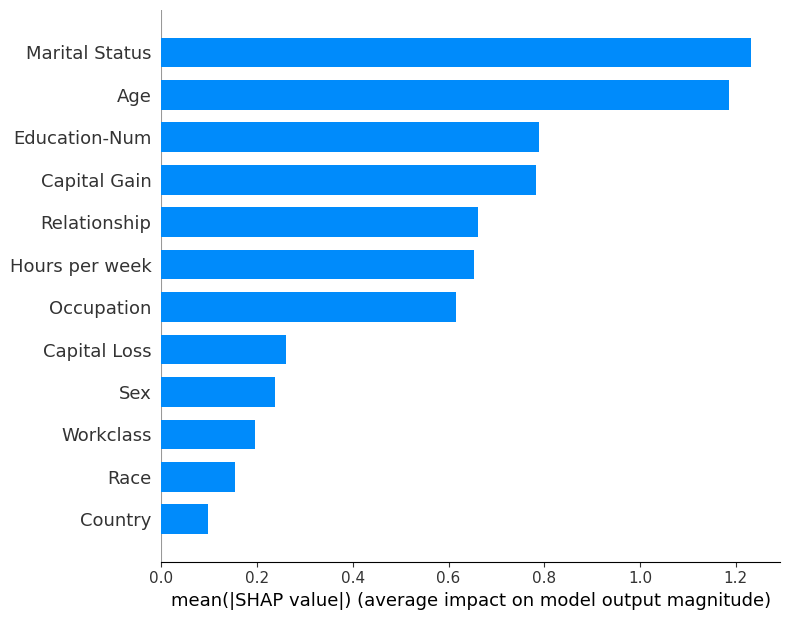

In [ ]:
shap.initjs()
shap.summary_plot(shap_values,
                  X_test, plot_type="bar")

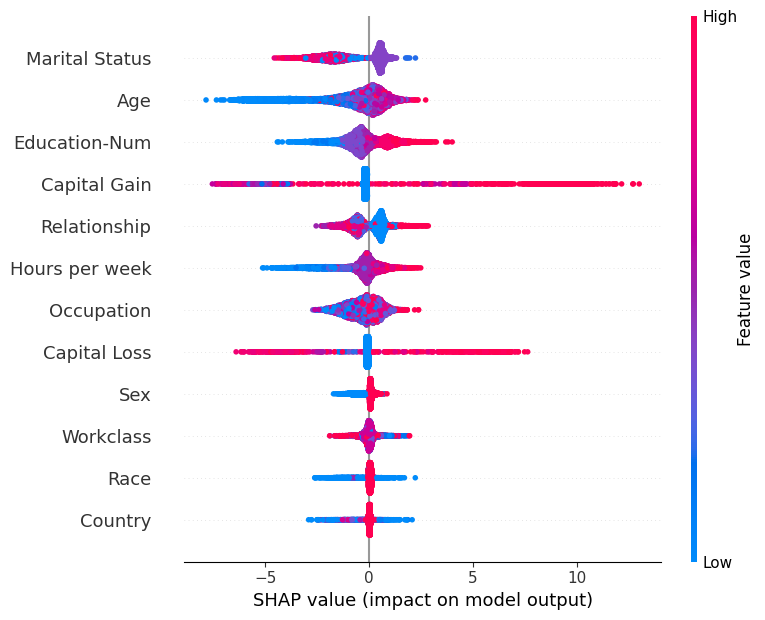

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, X_test)

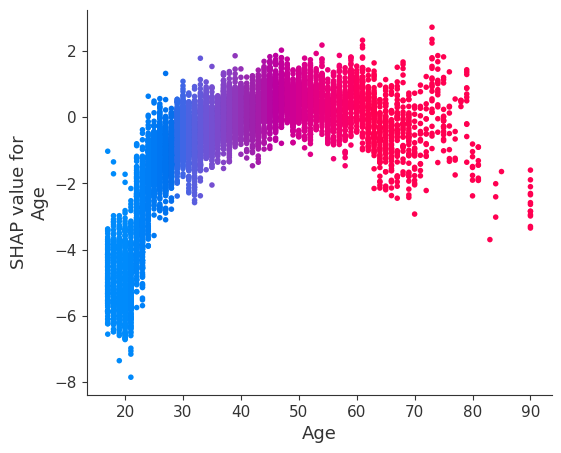

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Age', interaction_index='Age',
                     shap_values=shap_values,
                     features=X_test)

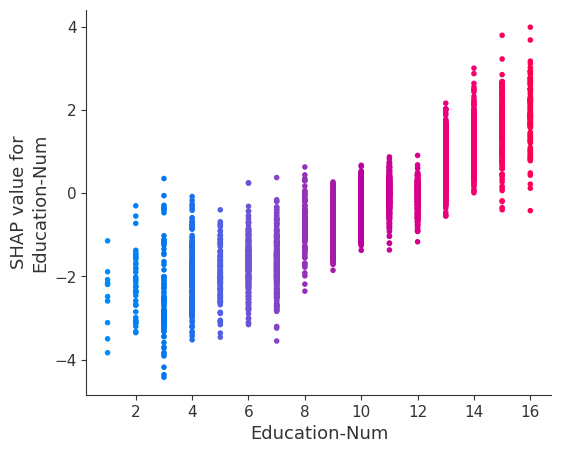

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Education-Num', interaction_index='Education-Num',
                     shap_values=shap_values,
                     features=X_test)

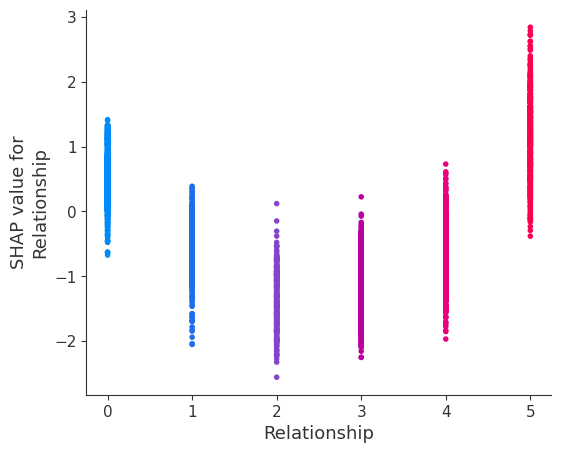

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Relationship', interaction_index='Relationship',
                     shap_values=shap_values,
                     features=X_test)

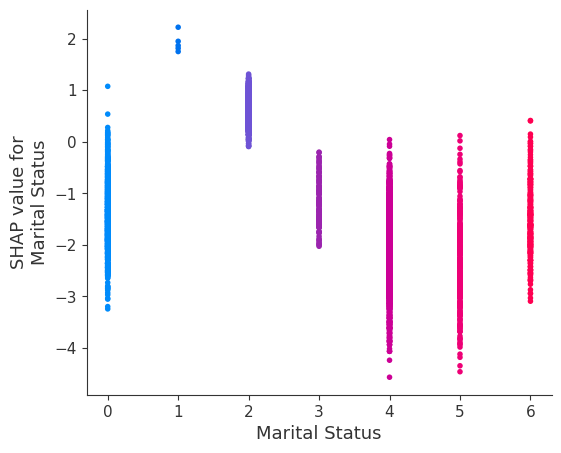

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Marital Status', interaction_index='Marital Status',
                     shap_values=shap_values,
                     features=X_test)

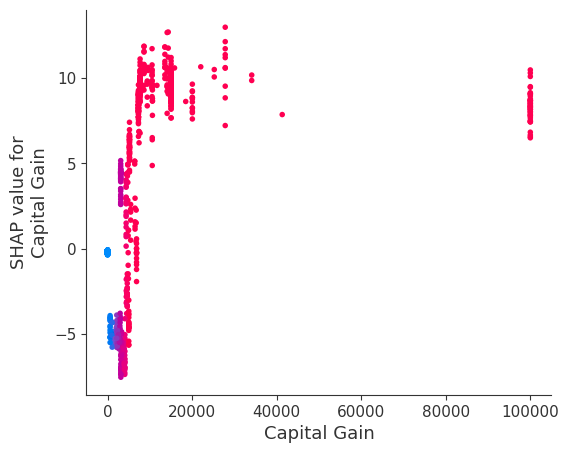

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Capital Gain', interaction_index='Capital Gain',
                     shap_values=shap_values,
                     features=X_test)

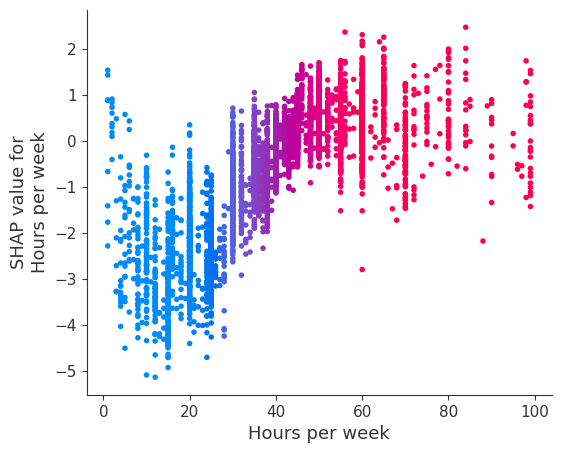

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Hours per week', interaction_index='Hours per week',
                     shap_values=shap_values,
                     features=X_test)

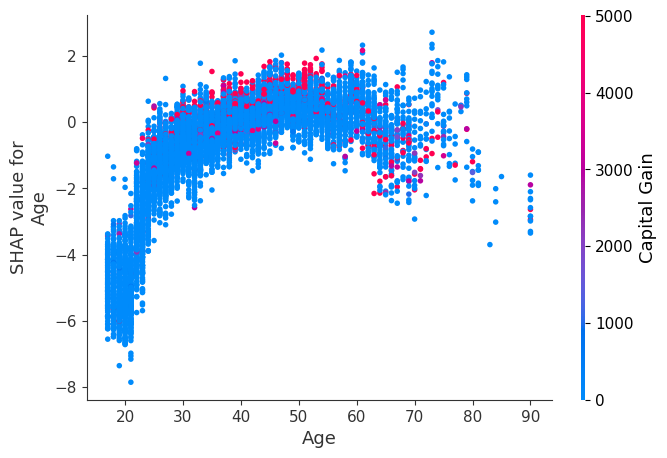

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Age', interaction_index='Capital Gain',
                     shap_values=shap_values, features=X_test,
                     display_features=X_test_disp)

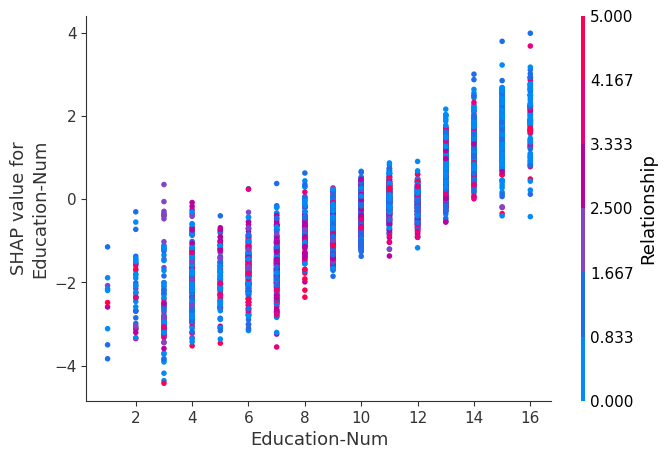

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Education-Num', interaction_index='Relationship',
                     shap_values=shap_values, features=X_test)

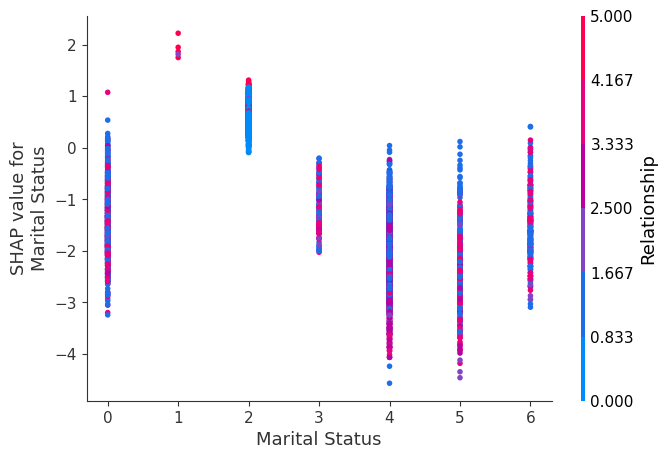

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Marital Status', interaction_index='Relationship',
                     shap_values=shap_values, features=X_test)

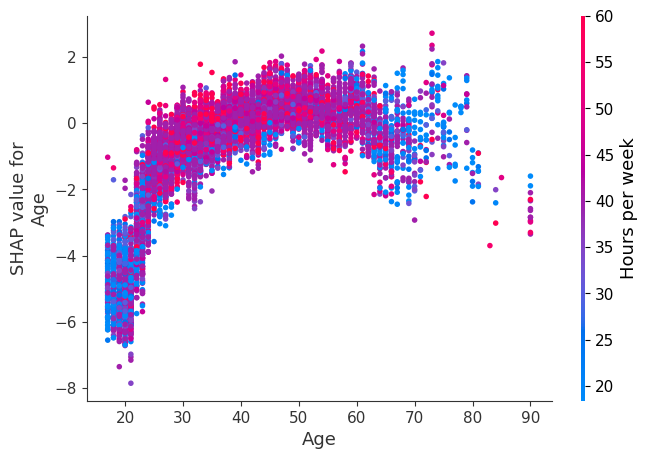

In [ ]:
shap.initjs()
shap.dependence_plot(ind='Age', interaction_index='Hours per week',
                     shap_values=shap_values, features=X_test)

**LIME**

In [ ]:
# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns,
                                                   class_names=['<=50K', '>50K'],
                                                   mode='classification')

# Choose a test instance to explain (e.g., the tenth instance in the test set)
i = 1
exp = explainer.explain_instance(X_test.values[i], xgc.predict_proba, num_features=10)

# Show the explanation in the notebook (or use exp.show_in_notebook() in Jupyter)
exp.show_in_notebook(show_table=True)

In [ ]:
# Choose a test instance to explain (e.g., the tenth instance in the test set)
i = 0
exp = explainer.explain_instance(X_test.values[i], xgc.predict_proba, num_features=10)

# Show the explanation in the notebook (or use exp.show_in_notebook() in Jupyter)
exp.show_in_notebook(show_table=True)

SHAP can generate local and global interpretations while LIME can generate local interpretations. From the respective instances chosen, both the approaches give similar interpretations. Although the model itself could have been improved by using stratified cross-validation but since my goal was to test the XAI approaches and their explainability so those processes are not followed here.